# Robust estimation
In this notebook we will explore signal processing using low-rank matrix completion and the effects of really nasty noise on the estimation of LTI models. α-Sub Gaussian noise is both highly impulsive and correlated in time, making it the perfect candidate to corrupt our measurement signals with. This kind of noise is common in shallow seawater as the common snapping shrimp produces noise with approximately this distribution. After having experimented with simulated data for a while, we'll have a go at an audio sample containing a dolphin whistle masked by real snapping-shrimp noise.

We start by generating some signals and some noise so that we can see how our methods work when we know the correct answer.

In [2]:
using Pkg
Pkg.activate(@__DIR__())

  Activating new project at `~/repos/julia_examples`


In [4]:
using ControlSystemIdentification, ControlSystemsBase, AlphaStableDistributions, DSP, TotalLeastSquares, Plots, Statistics, Random
default(show=false)
Random.seed!(0)
N = 10_000   # Number of samples
f = 100_000  # Sampling frequency
t = LinRange(0,N/f,N) # Time vector

F = [2000, 8000, 10000, 15000, 25000] # Vector of frequencies that make up the signal
na = 2length(F) # The order of AR models we're going to fit. Two poles per frequency peak in the spectrum are required.
y = sum(sin.(2π*f .* t) for f in F); # The clean signal

Below, we draw a sample from the `AlphaSubGaussian` distribution with default parameters and plot this noise together with the clean signal.

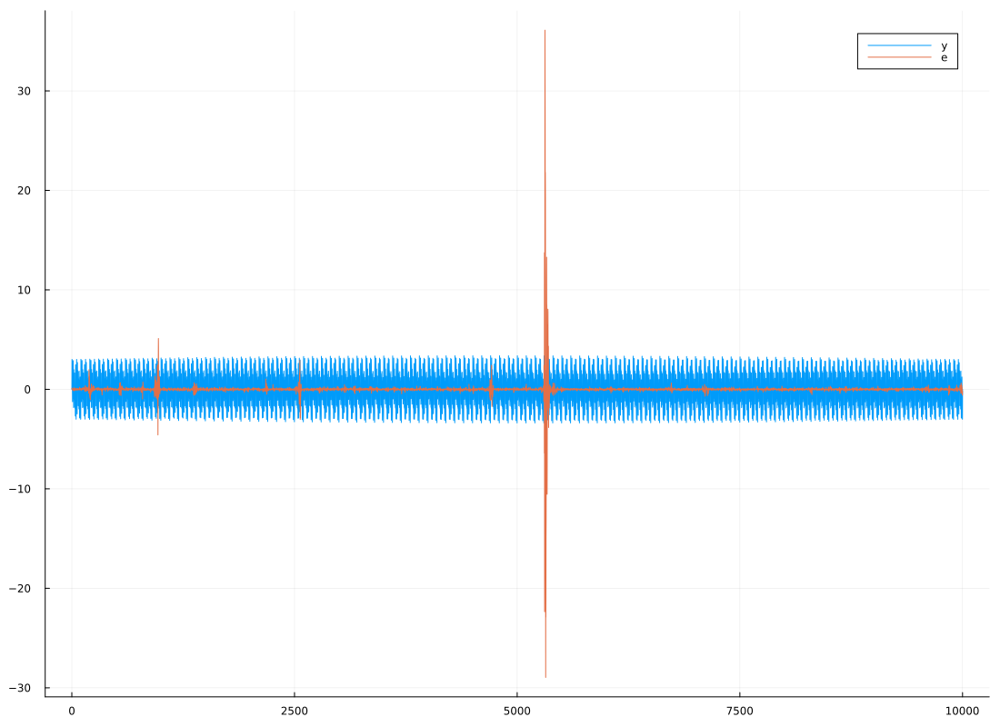

In [6]:
e = rand(AlphaSubGaussian(n=N))
e ./= std(e)
plot([y e], lab=["y" "e"])

As we can see, the noise is highly impulsive. Impulses are characterized by a flat spectrum, they are thus likely to mask interesting frequencies no matter where they appear.

Next, we estimate AR models using [ControlSystemIdentification.jl](https://github.com/baggepinnen/ControlSystemIdentification.jl) in a number of different ways and plot their spectra. We do this for several different intensities of the noise.

σ = 0.0001
σ = 0.00031622776601683794
σ = 0.001
σ = 0.0031622776601683794
σ = 0.01
σ = 0.03162277660168379
σ = 0.1
σ = 0.31622776601683794
σ = 1.0


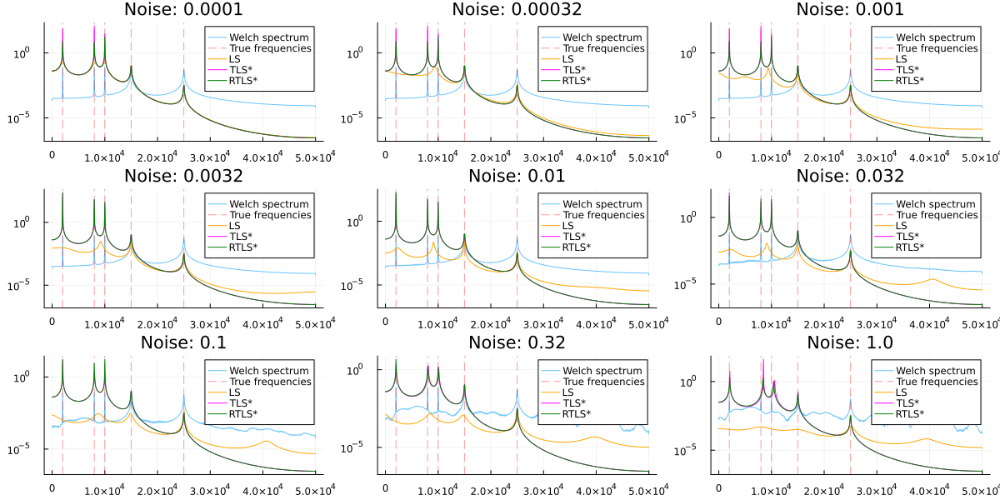

In [9]:
σvec = exp10.(LinRange(-4, 0, 9)) # Vector of noise intensities
figs = map(σvec) do σ
    @show σ
    yn = y + σ*e # Form the noisy signal
    dn = iddata(yn,1/f)

    P = welch_pgram(yn, fs=f) # Estimate Welch spectrum
    freqs = Vector(P.freq)
    fig = plot(freqs, .√P.power, yscale=:log10, lab="Welch spectrum", title="Noise: $(round(σ, sigdigits=2))", alpha=0.6)
    vline!(F, l=(:red, :dash, 0.4), lab="True frequencies")

    Gls = ar(dn, na)
    b = bodev(Gls, 2pi .* freqs)[1]
    plot!(freqs, b./N, lab="LS", c=:orange)

    yf = lowrankfilter(yn, 80)
    df = iddata(yf,1/f)

    Gtls = ar(df, na, estimator=tls)
    b = bodev(Gtls, 2pi .* freqs)[1]
    plot!(freqs, b./N, lab="TLS*", c=:magenta)

    robust = (A,y)->TotalLeastSquares.rtls(A,y,iters=400, tol=2e-6)
    Grtls = ar(df, na, estimator=robust)
    b = bodev(Grtls, 2pi .* freqs)[1]
    plot!(freqs, b./N, lab="RTLS*", c=:green)

    fig
end
plot(figs..., size=(1200,600))

As we can see, the standard least-squares `ls` estimate does not model the signal very well. Total least-squares `tls` does a better job, and robust estimates using robust total least squares `rtls` does even better. Notice also the line `yn = lowrankfilter(yn, 50)`. This filters the signal by forming a lag-embedding `H` and estimating a separation of the embedding matrix into a low-rank matrix and a sparse noise matrix `H = L + S`. You can try removing this line and see how the performance degrades.

This [`lowrankfilter`](https://github.com/baggepinnen/TotalLeastSquares.jl#time-series-filtering) is actually really neat, we can see how well it removes the noise from the signal as a function of the embedding dimension `n`:

In [10]:
yn = y + e # Form the noisy signal
e0 = ControlSystemIdentification.rms(y-yn) # This is the error without filtering

0.9999729479541196

In [11]:
nvec = round.(Int, exp10.(LinRange(1, 2.8, 12)))
fits = map(nvec) do n
    yh = lowrankfilter(yn, n, tol=1e-3)
    ControlSystemIdentification.rms(y-yh)
end;

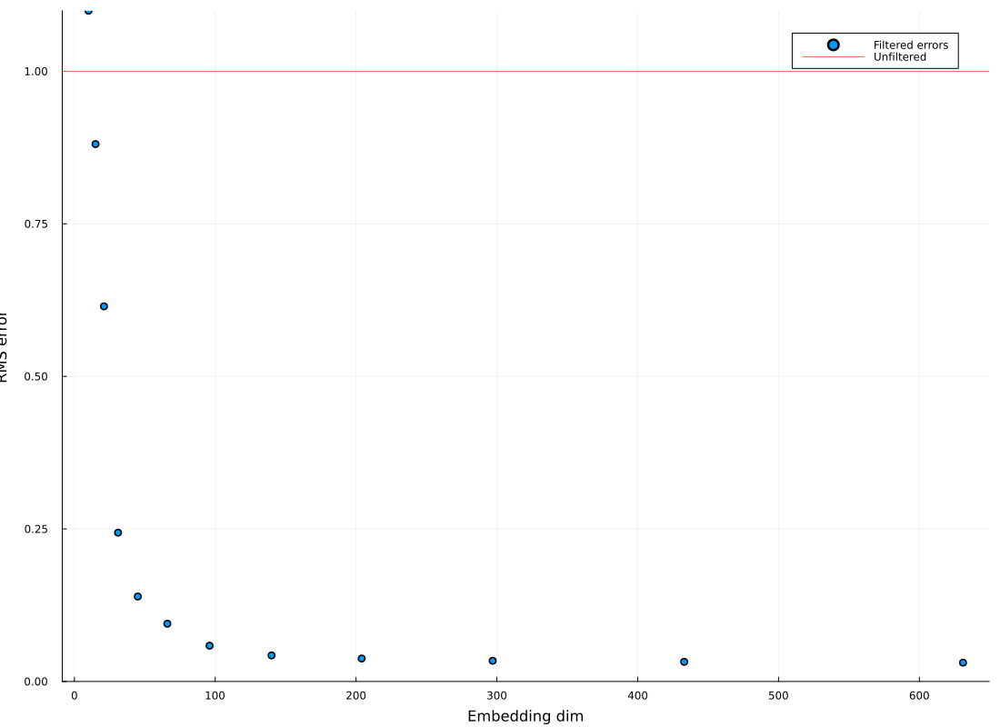

In [12]:
scatter(nvec,fits, ylabel="RMS error", xlabel="Embedding dim", lab="Filtered errors")
hline!([e0], lab="Unfiltered", ylims=(0,Inf))

We see that the error goes down rapidly in the beginning. One period of the smallest frequency must fit comfortably within the embedding vector, for our signal, this will be 

In [13]:
f/minimum(F)

50.0

We can also visualize the signals

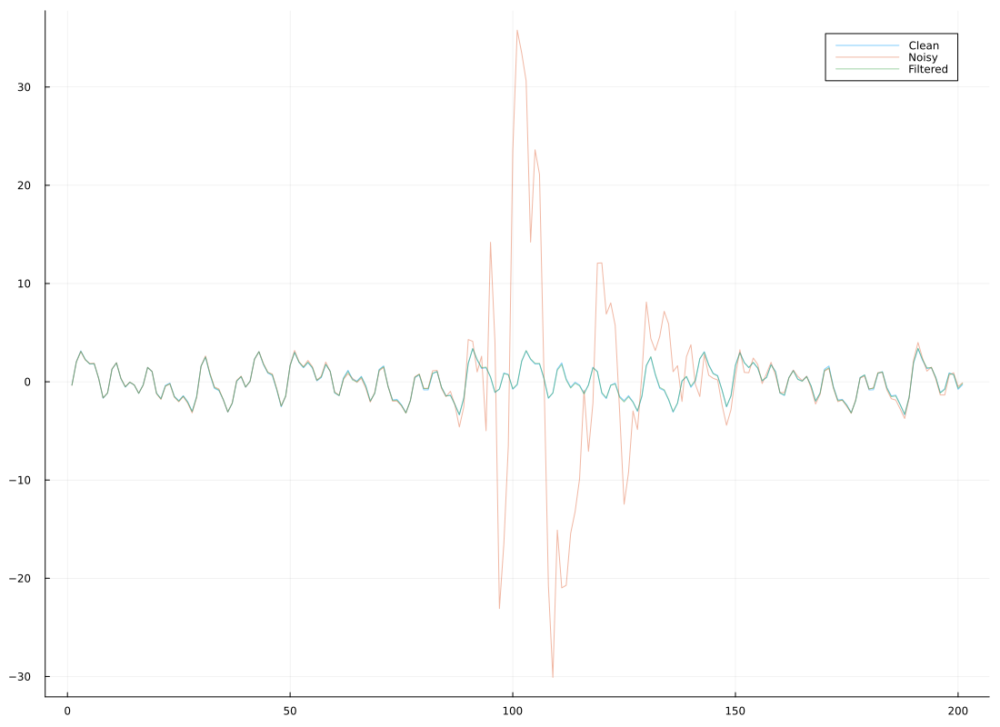

In [14]:
yh = lowrankfilter(yn, 200)

maxind = findmax(abs.(yn))[2]
plotinds = max(1,maxind-100):min(N, maxind+100)
plot([y yn yh][plotinds,:], lab=["Clean" "Noisy" "Filtered"], alpha=0.5)

We chose a small number of indices to plot, centered around the peak noise value. There should be very little difference between the clean signal and the filtered signal, while the noisy signal can deviate dramatically.

Te increased performance is, however, not for free. Increasing the dimension of the lag embedding causes the computation time to grow roughly as $\mathcal{O}(n^{1.5})$, let's have a look

In [15]:
nvec = round.(Int, exp10.(LinRange(1, 3, 12)))
times = map(nvec) do n
    @elapsed lowrankfilter(yn, n, tol=1e-3)
end;

fit[2] = 1.4290204474209227


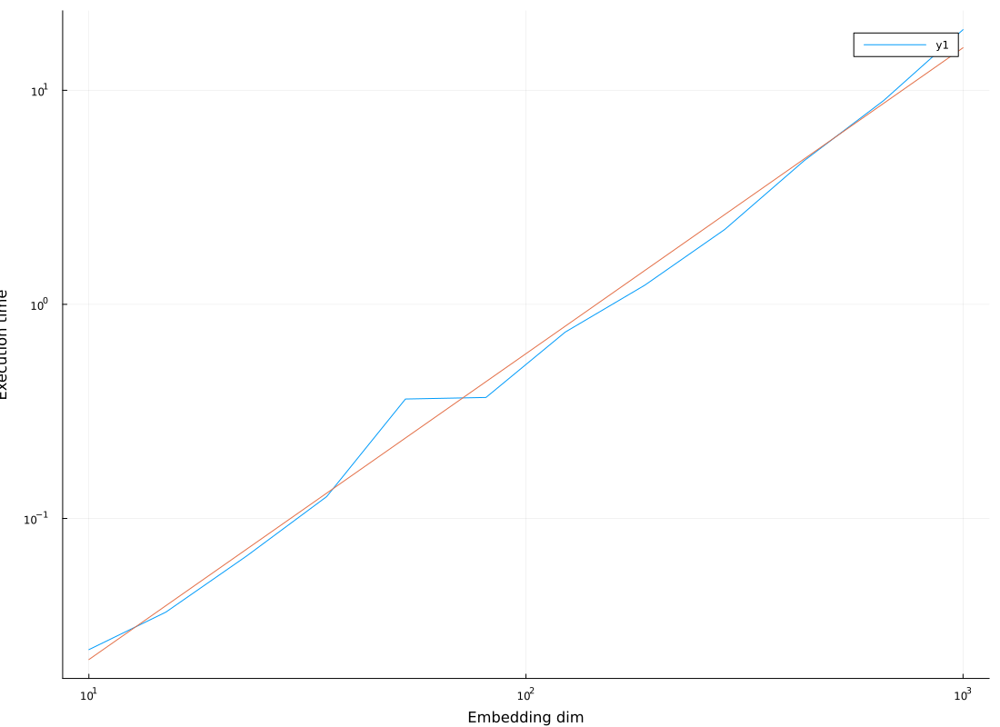

In [16]:
A = log.(nvec).^((0:1)')
fit = (A\log.(times))
@show fit[2]
plot(nvec, times, xscale=:log10, yscale=:log10, ylabel="Execution time", xlabel="Embedding dim")
plot!(nvec, exp.(A*fit), lab="")

Now, let's have a look at some real-life data. We load a 1-second audio clip containing a dolphin whistle masked by snapping-shrimp noise.

┌ Info: Precompiling LPVSpectral [26dcc766-85df-5edc-b560-6076d5dbac63]
└ @ Base loading.jl:1664


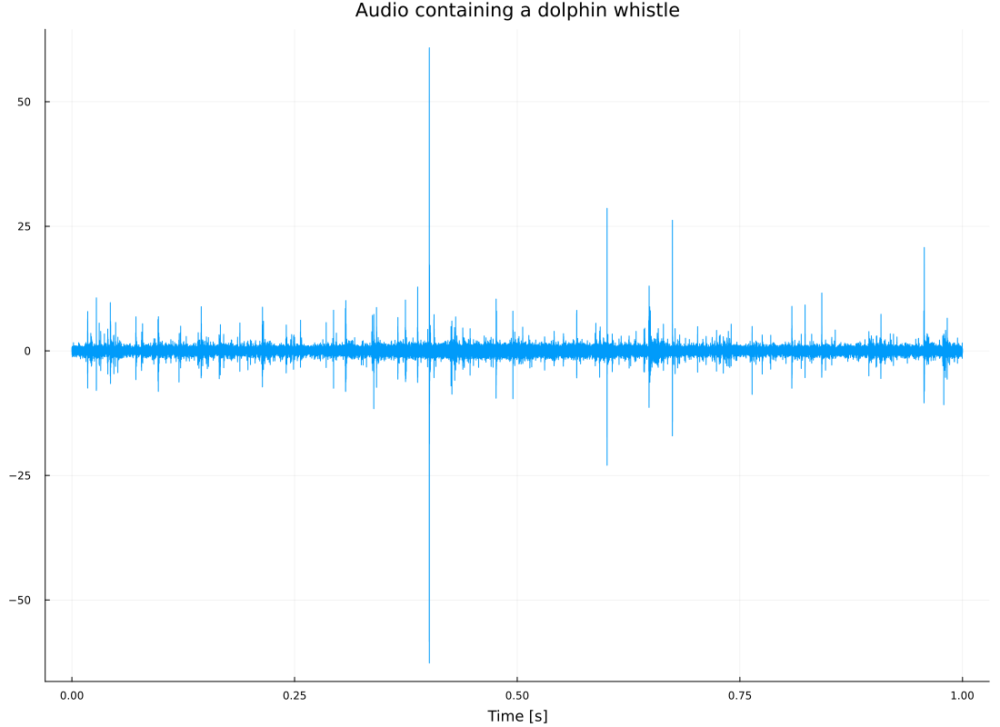

In [17]:
using WAV, LPVSpectral, Plots.PlotMeasures, TotalLeastSquares
wavwrite_normalized(y,fs,p) = wavwrite(0.05*y./quantile(y,0.4), fs, p)
yn,fs = wavread("dolphin.wav");
yn = Float32.(yn[:] ./ std(yn))
plot(LinRange(0,1,length(yn)), yn, xlabel="Time [s]", title="Audio containing a dolphin whistle", lab="")

Can you spot the whistle?

In order to make sure our filtering does not just solve a trivial problem, we compare the filtering to a heuristic method, simply thresholding large values.

1 cost: 0.7456
2 cost: 0.2961
3 cost: 0.1467
4 cost: 0.07527
5 cost: 0.04194
6 cost: 0.02522
7 cost: 0.0154
8 cost: 0.009224
converged


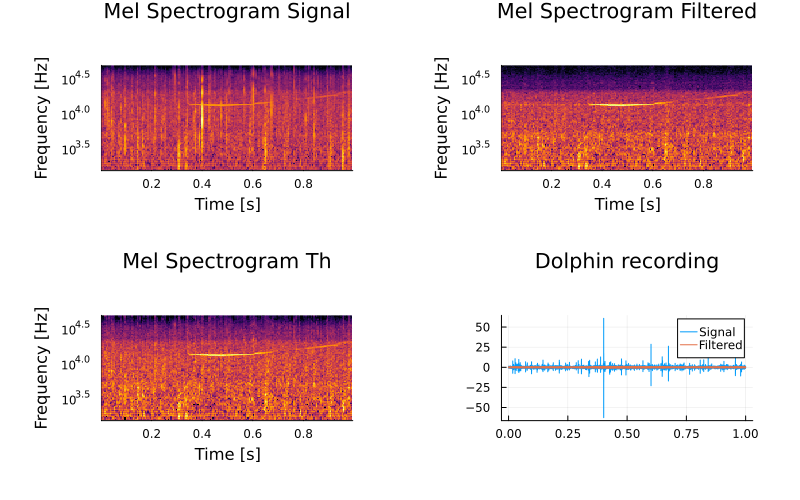

In [22]:
yth = clamp.(yn,-1,1)                                      # Thresholding at ± 1
yf = lowrankfilter(yn,1200, tol=1e-2,lag=50, verbose=true) # Filtered signal, this might take some time

MSs  = melspectrogram(yn,  1024, fs=fs, fmin=1500)
MSf  = melspectrogram(yf,  1024, fs=fs, fmin=1500)
MSth = melspectrogram(yth, 1024, fs=fs, fmin=1500)
plot(layout=4, margin=10mm, size=(800, 500))
plot!(MSs,  subplot=1, colorbar=false, title="Mel Spectrogram Signal")
plot!(MSf,  subplot=2, colorbar=false, title="Mel Spectrogram Filtered")
plot!(MSth, subplot=3, colorbar=false, title="Mel Spectrogram Th")
plot!(range(0, step=1/fs, length=length(yn)), [yn yf], subplot=4, lab=["Signal" "Filtered"], title="Dolphin recording")

The filtering seems to have worked, the dolphin whistle appearing at around 10kHz is much clearer in the filtered spectrogram compared to in the unfiltered spectrogram. It is also appears much clearer in the heuristically thresholded spectrogram.

To make it easier to visually asses the performance, we plot standard Welch periodograms of the signals:

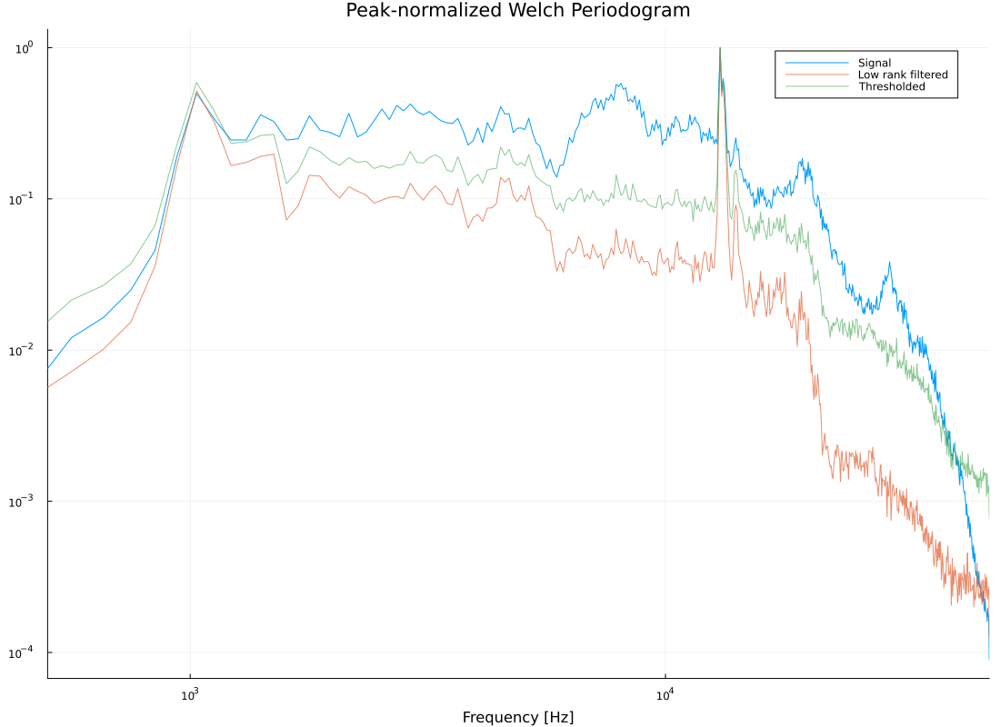

In [23]:
MSs  = welch_pgram(yn,  1024, fs=fs)
MSf  = welch_pgram(yf,  1024, fs=fs)
MSth = welch_pgram(yth, 1024, fs=fs)
plot(layout=1, xlabel="Frequency [Hz]", title="Peak-normalized Welch Periodogram", 
     yscale=:log10, xscale=:log10, xlims=(exp10(2.7),Inf))
plot!(MSs.freq[2:end],  MSs.power[2:end] ./maximum(MSs.power),             lab="Signal")
plot!(MSf.freq[2:end],  MSf.power[2:end] ./maximum(MSf.power),  alpha=0.8, lab="Low rank filtered")
plot!(MSth.freq[2:end], MSth.power[2:end]./maximum(MSth.power), alpha=0.6, lab="Thresholded")

The periodograms above are all normalized such that the peak value is 1 to make it easier to see how well they suppress frequencies outside the dolphin whistle.

We see that the low-rank filtering removes all the high-frequency content that is introduced by the impulsive noise. The heuristic method actually introduce some additional high-frequency noise at the very highest frequencies. This is expected due to the thresholding operation which is nonlinear.

## Signal processing using low-rank matrix completion
As mentioned above, the low-rank filter is forming a lag-embedding `H` and decomposes this matrix into a low-rank matrix and a sparse noise matrix `H = L + S`. This procedure is sometimes referred to as Robust PCA, and can, in addition to handling outliers, be used to impute missing data in matrices or time-series. The `lowrankfilter` and the underlysing `rpca` are implemented in [TotalLeastSquares.jl](https://github.com/baggepinnen/TotalLeastSquares.jl).

That was all for today, happy robust filtering and estimation!